In [1]:
# Uncomment below to load in notebook Tensorboard module
#load_ext tensorboard

### Import Data

In [1]:
import os
import gc
import datetime
import cv2 as cv
import numpy as np
import pandas as pd
from time import sleep
import tensorflow as tf
import matplotlib.pyplot as plt
from scipy.sparse import csr_matrix
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout, AveragePooling2D

In [2]:
data = pd.read_csv('D:\\ASL.csv', delimiter=',')
df = data.to_numpy()

In [3]:
df.shape

(13002, 6)

In [4]:
df[0, :]

array(['k!06x.jpg', 72, 103, 76, 75, 'A'], dtype=object)

In [5]:
np.random.seed(0)
np.random.shuffle(df)
np.random.shuffle(df)

In [6]:
images = df[:, 0]
labels = df[:, -1]
PATH = 'D:\\ASL Images'

assert len(images)==len(labels), "There was a data loading issue"

In [7]:
def gather_images(img_names, dir_name, root):
    paths = []
    for dir, img in zip(dir_name, img_names):
        file = os.path.join(dir, img)
        paths.append(os.path.join(root, file))
    return paths

In [8]:
im_paths = gather_images(images, labels, PATH)

In [9]:
print(im_paths[0], df[0])

D:\ASL Images\E\%%th9.jpg ['%%th9.jpg' 105 69 61 78 'E']


In [10]:
def load_images(imPaths):
    img_array = []
    try:
        for path in imPaths:
            img = cv.imread(path, 0)
            img = cv.resize(img, (120, 120), interpolation=cv.INTER_CUBIC)
            if img is not None:
                img_array.append(img)
    except cv.error as e:
        print(e)
    
    return img_array

In [11]:
img_array = load_images(im_paths)

### Encode Labels

In [12]:
Y = df[:, 1:]
Y.shape

(13002, 5)

In [13]:
Y[Y[:,-1]=='A', -1] = 0
Y[Y[:,-1]=='B', -1] = 1
Y[Y[:,-1]=='C', -1] = 2
Y[Y[:,-1]=='D', -1] = 3
Y[Y[:,-1]=='E', -1] = 4
Y[Y[:,-1]=='F', -1] = 5
Y[Y[:,-1]=='G', -1] = 6
Y[Y[:,-1]=='H', -1] = 7
Y[Y[:,-1]=='I', -1] = 8
Y[Y[:,-1]=='J', -1] = 9
Y[Y[:,-1]=='K', -1] = 10
Y[Y[:,-1]=='L', -1] = 11
Y[Y[:,-1]=='M', -1] = 12
Y[Y[:,-1]=='N', -1] = 13
Y[Y[:,-1]=='O', -1] = 14
Y[Y[:,-1]=='P', -1] = 15
Y[Y[:,-1]=='Q', -1] = 16
Y[Y[:,-1]=='R', -1] = 17
Y[Y[:,-1]=='S', -1] = 18
Y[Y[:,-1]=='T', -1] = 19
Y[Y[:,-1]=='U', -1] = 20
Y[Y[:,-1]=='V', -1] = 21
Y[Y[:,-1]=='W', -1] = 22
Y[Y[:,-1]=='X', -1] = 23
Y[Y[:,-1]=='Y', -1] = 24
Y[Y[:,-1]=='Z', -1] = 25

In [14]:
vals, counts = np.unique(Y[:, -1], return_counts=True)
print(vals, counts)

[0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25] [500 500 500 500 500 500 500 510 500 500 500 500 500 500 500 492 500 500
 500 500 500 500 500 500 500 500]


### Image Distribution

[Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '510'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '492'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500'),
 Text(0, 0, '500')]

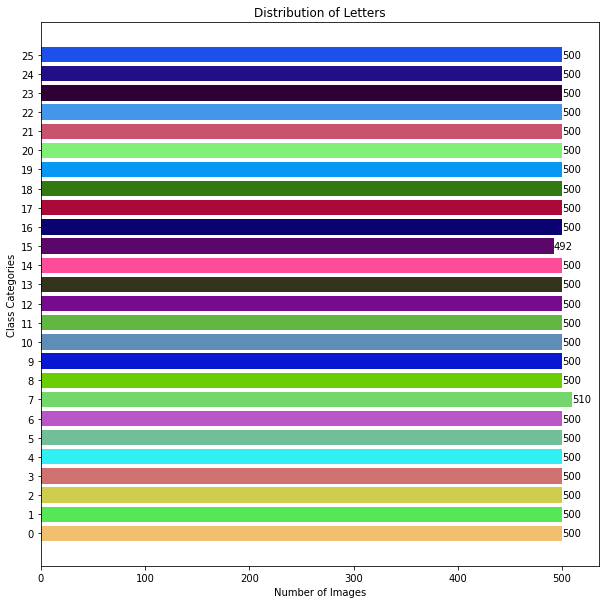

In [15]:
# Plot number of images in each category
from random import uniform

colors = []

for _ in range(26):
    colors.append((uniform(0,1), uniform(0, 1), uniform(0, 1)))

ind = np.arange(len(counts))

fig, ax = plt.subplots(figsize=(10,10))
ax.barh(vals, counts, color=colors)
ax.set_yticks(ind)
ax.set_yticklabels(vals)
plt.xlabel('Number of Images')
plt.ylabel('Class Categories')
plt.title('Distribution of Letters')

ax.bar_label(ax.containers[0])

In [16]:
y = to_categorical(Y[:,-1])

In [17]:
ROI = Y[:, :-1]

In [18]:
def split_data(X, Y, points, y_ROI):
    
    data_len = int(X.shape[0] * 0.8)

    X_Train = X[:data_len, :]
    X_Val = X[data_len:, :]
    Y_Train = Y[:data_len, :]
    Y_Val = Y[data_len:, :]
    ROI_Train = points[:data_len, :]
    ROI_Val = points[data_len:, :]
    ROI_T_Y = y_ROI[:data_len, :]
    ROI_V_Y = y_ROI[data_len:, :]
    return X_Train, X_Val, Y_Train, Y_Val, ROI_Train, ROI_Val, ROI_T_Y, ROI_V_Y

In [19]:
X = np.array(img_array) / 255.0
img = X[0]
X = X.reshape(X.shape[0], 120, 120, 1)

In [20]:
X.shape

(13002, 120, 120, 1)

### Normalize Bounding Points

In [21]:
h, w = img.shape[:2]
ROI_float = []

In [22]:
for box in ROI:
    startx, starty, endx, endy = box
    startx = float(startx) / w
    starty = float(starty) / h
    endy = float(endy) / h
    endx = float(endx) / w
    ROI_float.append([startx, starty, endy, endx])

In [23]:
ROI_float = np.array(ROI_float, dtype='float32')
ROI = np.array(ROI, dtype='float32')

In [24]:
ROI[0, :].shape

(4,)

In [25]:
X_T, X_V, Y_T, Y_V, ROI_T, ROI_V, roi_t, roi_y = split_data(X, y, ROI_float, ROI)

In [26]:
# from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Input, LeakyReLU, SpatialDropout2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

In [27]:
MOD_PATH = os.path.join(
    "D:\\",
    "MODELS",
    "combined_model_120_13.hdf5",
)

log_dir = os.path.join(
    "C:\\",
    "Users",
    "cody_",
    "OneDrive",
    "Desktop",
    "5300",
    "Tensorboard",
    datetime.datetime.now().strftime("%Y%m%d-%H%M%S"),
)

### Create Additional Training Images

In [28]:
train_datagen = ImageDataGenerator(
        rotation_range=45,
        zoom_range = 0.2, 
        width_shift_range = 0.1,
        height_shift_range = 0.1,
        shear_range = 0.15,
        horizontal_flip = True,
        vertical_flip=True,
        brightness_range = [0.2, 1.0],
        fill_mode = "nearest")

train_gen = train_datagen.flow(X_T, Y_T, shuffle=False, batch_size=32)

In [29]:
test_images = []
test_labels = []
for i in range(0, int(326)):
    test_images.extend(np.array(train_gen[i][0]))
    test_labels.extend(np.array(train_gen[i][1]))
                       
test_images = np.array(test_images)
test_labels = np.array(test_labels)
                       
print(test_images.shape, test_labels.shape)

(10401, 120, 120, 1) (10401, 26)


In [30]:
X_Test = np.concatenate([test_images, X_T])
Y_Test = np.concatenate([test_labels, Y_T])
ROI_Test = np.concatenate([ROI_T, ROI_T])

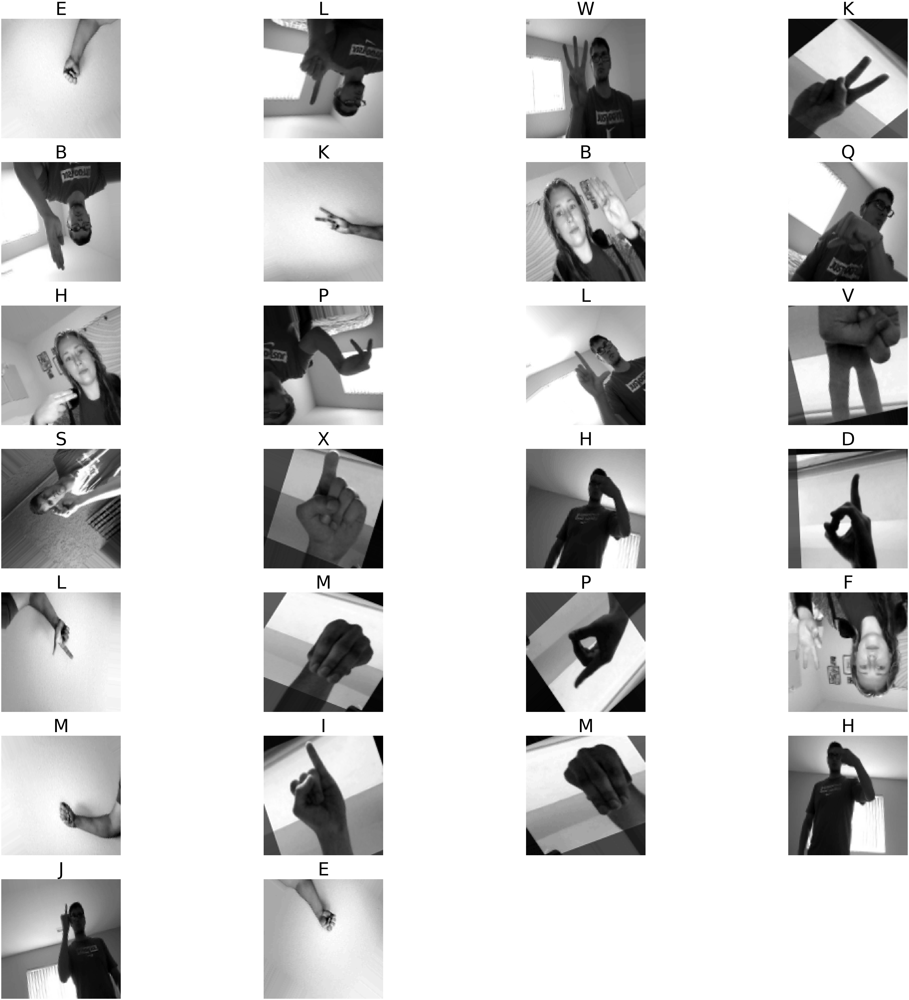

In [31]:
classes =  [
        'A', 'B', 'C', 'D',
        'E', 'F', 'G', 'H',
        'I', 'J', 'K', 'L',
        'M', 'N', 'O', 'P',
        'Q', 'R', 'S', 'T',
        'U', 'V', 'W', 'X',
        'Y', 'Z'
    ]

plt.figure(figsize=(100,100))
j = 1
for i in range(26):
    plt.subplot(7,4,j)
    plt.imshow(X_Test[i], cmap='gray')
    plt.axis('off')
    u, ind = np.unique(Y_Test[i], return_index=True)
    plt.title(classes[ind[1]], fontdict=dict({'fontsize' : 100}))
    j+=1

In [32]:
print(X_Test.shape, Y_Test.shape, ROI_Test.shape)

(20802, 120, 120, 1) (20802, 26) (20802, 4)


### Model and Architechture

In [33]:
trainTargets = {
    "class_label": Y_Test,
    "bounding_box": ROI_Test
}

testTargets = {
    "class_label": Y_V,
    "bounding_box": ROI_V
}

In [34]:
imgs = Input(shape=(X[0, :, :, :].shape))
conv = Conv2D(32, (7, 7), 2, activation=LeakyReLU(alpha=0.01))(imgs)
conv = MaxPooling2D(pool_size=(2,2), strides=(2,2))(conv)
conv = Conv2D(96, (3,3), activation=LeakyReLU(alpha=0.1))(conv)
conv = SpatialDropout2D(0.3)(conv) #added for the 240 X 240 model
conv = MaxPooling2D(pool_size=(2,2), strides=(2,2))(conv)
conv = Conv2D(64, (1,1), activation=LeakyReLU(alpha=0.01))(conv)
conv = Conv2D(128, (3,3), activation=LeakyReLU(alpha=0.1))(conv)
conv = Conv2D(128, (1,1), activation=LeakyReLU(alpha=0.01))(conv)
conv = Conv2D(256, (3,3), activation=LeakyReLU(alpha=0.1))(conv)
conv = Dropout(0.3)(conv)
conv = AveragePooling2D(pool_size=(2,2), strides=(2,2))(conv)
flatten = Flatten()(conv)

pic_head = Dense(512, activation='relu')(flatten)
pic_head = Dense(256, activation='relu')(pic_head)
pic_head = Dense(128, activation='relu')(pic_head)
pic_head = Dense(26, activation='softmax', name="class_label")(pic_head)

# boxes = Input(shape=(ROI[0, :].shape))
bbox = Dense(32, activation='relu')(flatten)
bbox = Dense(64, activation='relu')(bbox)
bbox = Dense(32, activation='relu')(bbox)
bbox = Dense(4, activation='sigmoid', name='bounding_box')(bbox)

model = Model(inputs=imgs, outputs=(pic_head,bbox))

losses = {
    "class_label": "categorical_crossentropy",
    "bounding_box": "mse",
}

model_save = ModelCheckpoint(filepath=MOD_PATH, monitor='val_loss',
                            save_best_only=True, save_weights_only=True, verbose=1)
early_stop = EarlyStopping(monitor='val_loss', mode='min', patience=100, verbose=1)

# tb_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=10, write_graph=True,
#                                    write_images=True, embeddings_freq=1, write_steps_per_second=True, update_freq=1)


opt = Adam(learning_rate=1e-5)
model.compile(loss=losses, optimizer=opt, metrics=["accuracy"])
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 120, 120, 1) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 57, 57, 32)   1600        input_1[0][0]                    
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 28, 28, 32)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 26, 26, 96)   27744       max_pooling2d[0][0]              
______________________________________________________________________________________________

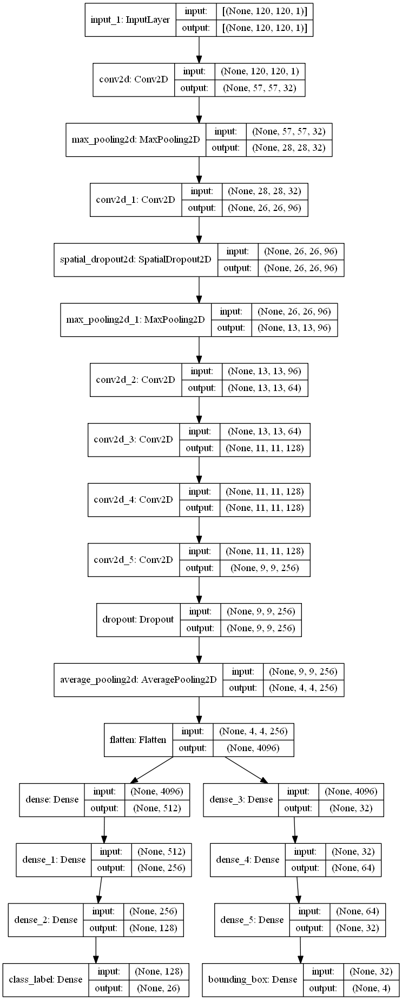

In [36]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True, dpi=96)

In [37]:
#tensorboard --inspect --logdir=logdir

In [38]:
History = model.fit(
    X_Test, trainTargets,
    validation_data=(X_V, testTargets),
    batch_size=32,
    epochs=500,
    callbacks=[model_save, early_stop],
    verbose=1)

Epoch 1/500
651/651 [==============================] - 17s 16ms/step - loss: 3.4734 - class_label_loss: 3.3189 - bounding_box_loss: 0.1545 - class_label_accuracy: 0.0376 - bounding_box_accuracy: 0.3776 - val_loss: 3.4310 - val_class_label_loss: 3.2581 - val_bounding_box_loss: 0.1729 - val_class_label_accuracy: 0.0381 - val_bounding_box_accuracy: 0.3972

Epoch 00001: val_loss improved from inf to 3.43097, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 2/500
651/651 [==============================] - 10s 15ms/step - loss: 3.4109 - class_label_loss: 3.2652 - bounding_box_loss: 0.1457 - class_label_accuracy: 0.0413 - bounding_box_accuracy: 0.3599 - val_loss: 3.4259 - val_class_label_loss: 3.2581 - val_bounding_box_loss: 0.1678 - val_class_label_accuracy: 0.0411 - val_bounding_box_accuracy: 0.1557

Epoch 00002: val_loss improved from 3.43097 to 3.42586, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 3/500
651/651 [==============================] - 9s 15ms/step - loss


Epoch 00018: val_loss improved from 3.32154 to 3.30534, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 19/500
651/651 [==============================] - 10s 15ms/step - loss: 3.1101 - class_label_loss: 3.0201 - bounding_box_loss: 0.0900 - class_label_accuracy: 0.1246 - bounding_box_accuracy: 0.4954 - val_loss: 3.2857 - val_class_label_loss: 3.1870 - val_bounding_box_loss: 0.0987 - val_class_label_accuracy: 0.0604 - val_bounding_box_accuracy: 0.4344

Epoch 00019: val_loss improved from 3.30534 to 3.28571, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 20/500
651/651 [==============================] - 10s 15ms/step - loss: 3.0885 - class_label_loss: 3.0002 - bounding_box_loss: 0.0882 - class_label_accuracy: 0.1328 - bounding_box_accuracy: 0.5004 - val_loss: 3.2638 - val_class_label_loss: 3.1681 - val_bounding_box_loss: 0.0957 - val_class_label_accuracy: 0.0631 - val_bounding_box_accuracy: 0.4344

Epoch 00020: val_loss improved from 3.28571 to 3.26378, saving mode


Epoch 00053: val_loss improved from 1.62031 to 1.57948, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 54/500
651/651 [==============================] - 9s 14ms/step - loss: 1.8366 - class_label_loss: 1.7777 - bounding_box_loss: 0.0588 - class_label_accuracy: 0.4805 - bounding_box_accuracy: 0.6218 - val_loss: 1.5425 - val_class_label_loss: 1.4937 - val_bounding_box_loss: 0.0488 - val_class_label_accuracy: 0.5709 - val_bounding_box_accuracy: 0.6363

Epoch 00054: val_loss improved from 1.57948 to 1.54247, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 55/500
651/651 [==============================] - 9s 14ms/step - loss: 1.8061 - class_label_loss: 1.7472 - bounding_box_loss: 0.0589 - class_label_accuracy: 0.4850 - bounding_box_accuracy: 0.6198 - val_loss: 1.5355 - val_class_label_loss: 1.4866 - val_bounding_box_loss: 0.0490 - val_class_label_accuracy: 0.5744 - val_bounding_box_accuracy: 0.6405

Epoch 00055: val_loss improved from 1.54247 to 1.53554, saving model 


Epoch 00071: val_loss did not improve from 1.01920
Epoch 72/500
651/651 [==============================] - 9s 14ms/step - loss: 1.3742 - class_label_loss: 1.3189 - bounding_box_loss: 0.0552 - class_label_accuracy: 0.6126 - bounding_box_accuracy: 0.6252 - val_loss: 0.9822 - val_class_label_loss: 0.9376 - val_bounding_box_loss: 0.0446 - val_class_label_accuracy: 0.7520 - val_bounding_box_accuracy: 0.6401

Epoch 00072: val_loss improved from 1.01920 to 0.98220, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 73/500
651/651 [==============================] - 9s 14ms/step - loss: 1.3535 - class_label_loss: 1.2983 - bounding_box_loss: 0.0552 - class_label_accuracy: 0.6174 - bounding_box_accuracy: 0.6240 - val_loss: 0.9403 - val_class_label_loss: 0.8963 - val_bounding_box_loss: 0.0440 - val_class_label_accuracy: 0.7770 - val_bounding_box_accuracy: 0.6374

Epoch 00073: val_loss improved from 0.98220 to 0.94030, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 74/500
651/6


Epoch 00089: val_loss improved from 0.68312 to 0.66017, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 90/500
651/651 [==============================] - 9s 14ms/step - loss: 1.0360 - class_label_loss: 0.9832 - bounding_box_loss: 0.0528 - class_label_accuracy: 0.7069 - bounding_box_accuracy: 0.6359 - val_loss: 0.6440 - val_class_label_loss: 0.6017 - val_bounding_box_loss: 0.0423 - val_class_label_accuracy: 0.8343 - val_bounding_box_accuracy: 0.6517

Epoch 00090: val_loss improved from 0.66017 to 0.64403, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 91/500
651/651 [==============================] - 9s 14ms/step - loss: 1.0151 - class_label_loss: 0.9622 - bounding_box_loss: 0.0529 - class_label_accuracy: 0.7096 - bounding_box_accuracy: 0.6385 - val_loss: 0.6234 - val_class_label_loss: 0.5815 - val_bounding_box_loss: 0.0419 - val_class_label_accuracy: 0.8524 - val_bounding_box_accuracy: 0.6505

Epoch 00091: val_loss improved from 0.64403 to 0.62337, saving model 

Epoch 108/500
651/651 [==============================] - 9s 14ms/step - loss: 0.7784 - class_label_loss: 0.7272 - bounding_box_loss: 0.0512 - class_label_accuracy: 0.7756 - bounding_box_accuracy: 0.6458 - val_loss: 0.4198 - val_class_label_loss: 0.3791 - val_bounding_box_loss: 0.0407 - val_class_label_accuracy: 0.8977 - val_bounding_box_accuracy: 0.6655

Epoch 00108: val_loss improved from 0.42023 to 0.41977, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 109/500
651/651 [==============================] - 9s 14ms/step - loss: 0.7633 - class_label_loss: 0.7122 - bounding_box_loss: 0.0511 - class_label_accuracy: 0.7850 - bounding_box_accuracy: 0.6489 - val_loss: 0.4333 - val_class_label_loss: 0.3929 - val_bounding_box_loss: 0.0404 - val_class_label_accuracy: 0.8939 - val_bounding_box_accuracy: 0.6586

Epoch 00109: val_loss did not improve from 0.41977
Epoch 110/500
651/651 [==============================] - 9s 14ms/step - loss: 0.7589 - class_label_loss: 0.7081 - bounding_box


Epoch 00126: val_loss improved from 0.31766 to 0.30228, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 127/500
651/651 [==============================] - 9s 15ms/step - loss: 0.5859 - class_label_loss: 0.5361 - bounding_box_loss: 0.0498 - class_label_accuracy: 0.8368 - bounding_box_accuracy: 0.6570 - val_loss: 0.2875 - val_class_label_loss: 0.2481 - val_bounding_box_loss: 0.0395 - val_class_label_accuracy: 0.9331 - val_bounding_box_accuracy: 0.6659

Epoch 00127: val_loss improved from 0.30228 to 0.28753, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 128/500
651/651 [==============================] - 10s 15ms/step - loss: 0.5792 - class_label_loss: 0.5295 - bounding_box_loss: 0.0496 - class_label_accuracy: 0.8383 - bounding_box_accuracy: 0.6587 - val_loss: 0.2801 - val_class_label_loss: 0.2407 - val_bounding_box_loss: 0.0394 - val_class_label_accuracy: 0.9400 - val_bounding_box_accuracy: 0.6674

Epoch 00128: val_loss improved from 0.28753 to 0.28012, saving mod


Epoch 00163: val_loss did not improve from 0.15660
Epoch 164/500
651/651 [==============================] - 10s 15ms/step - loss: 0.3612 - class_label_loss: 0.3141 - bounding_box_loss: 0.0471 - class_label_accuracy: 0.9058 - bounding_box_accuracy: 0.6715 - val_loss: 0.1608 - val_class_label_loss: 0.1242 - val_bounding_box_loss: 0.0366 - val_class_label_accuracy: 0.9754 - val_bounding_box_accuracy: 0.7086

Epoch 00164: val_loss did not improve from 0.15660
Epoch 165/500
651/651 [==============================] - 10s 15ms/step - loss: 0.3509 - class_label_loss: 0.3037 - bounding_box_loss: 0.0472 - class_label_accuracy: 0.9089 - bounding_box_accuracy: 0.6722 - val_loss: 0.1582 - val_class_label_loss: 0.1220 - val_bounding_box_loss: 0.0362 - val_class_label_accuracy: 0.9719 - val_bounding_box_accuracy: 0.7170

Epoch 00165: val_loss did not improve from 0.15660
Epoch 166/500
651/651 [==============================] - 10s 15ms/step - loss: 0.3482 - class_label_loss: 0.3013 - bounding_box_lo

651/651 [==============================] - 10s 15ms/step - loss: 0.2310 - class_label_loss: 0.1856 - bounding_box_loss: 0.0454 - class_label_accuracy: 0.9446 - bounding_box_accuracy: 0.6807 - val_loss: 0.1002 - val_class_label_loss: 0.0650 - val_bounding_box_loss: 0.0352 - val_class_label_accuracy: 0.9877 - val_bounding_box_accuracy: 0.7263

Epoch 00202: val_loss improved from 0.10161 to 0.10016, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 203/500
651/651 [==============================] - 10s 15ms/step - loss: 0.2343 - class_label_loss: 0.1891 - bounding_box_loss: 0.0453 - class_label_accuracy: 0.9444 - bounding_box_accuracy: 0.6818 - val_loss: 0.1041 - val_class_label_loss: 0.0690 - val_bounding_box_loss: 0.0351 - val_class_label_accuracy: 0.9877 - val_bounding_box_accuracy: 0.7232

Epoch 00203: val_loss did not improve from 0.10016
Epoch 204/500
651/651 [==============================] - 10s 15ms/step - loss: 0.2264 - class_label_loss: 0.1811 - bounding_box_loss: 0.04


Epoch 00240: val_loss improved from 0.07885 to 0.07730, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 241/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1661 - class_label_loss: 0.1222 - bounding_box_loss: 0.0439 - class_label_accuracy: 0.9637 - bounding_box_accuracy: 0.6916 - val_loss: 0.0855 - val_class_label_loss: 0.0511 - val_bounding_box_loss: 0.0343 - val_class_label_accuracy: 0.9912 - val_bounding_box_accuracy: 0.7332

Epoch 00241: val_loss did not improve from 0.07730
Epoch 242/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1627 - class_label_loss: 0.1189 - bounding_box_loss: 0.0439 - class_label_accuracy: 0.9656 - bounding_box_accuracy: 0.6950 - val_loss: 0.0878 - val_class_label_loss: 0.0535 - val_bounding_box_loss: 0.0343 - val_class_label_accuracy: 0.9885 - val_bounding_box_accuracy: 0.7355

Epoch 00242: val_loss did not improve from 0.07730
Epoch 243/500
651/651 [==============================] - 10s 15ms/step -


Epoch 00279: val_loss did not improve from 0.06508
Epoch 280/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1329 - class_label_loss: 0.0899 - bounding_box_loss: 0.0430 - class_label_accuracy: 0.9745 - bounding_box_accuracy: 0.6979 - val_loss: 0.0744 - val_class_label_loss: 0.0407 - val_bounding_box_loss: 0.0337 - val_class_label_accuracy: 0.9923 - val_bounding_box_accuracy: 0.7397

Epoch 00280: val_loss did not improve from 0.06508
Epoch 281/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1358 - class_label_loss: 0.0930 - bounding_box_loss: 0.0428 - class_label_accuracy: 0.9739 - bounding_box_accuracy: 0.6964 - val_loss: 0.0633 - val_class_label_loss: 0.0295 - val_bounding_box_loss: 0.0338 - val_class_label_accuracy: 0.9946 - val_bounding_box_accuracy: 0.7347

Epoch 00281: val_loss improved from 0.06508 to 0.06328, saving model to D:\MODELS\combined_model_120_13.hdf5
Epoch 282/500
651/651 [==============================] - 10s 15ms/step -


Epoch 00299: val_loss did not improve from 0.06227
Epoch 300/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1184 - class_label_loss: 0.0761 - bounding_box_loss: 0.0423 - class_label_accuracy: 0.9795 - bounding_box_accuracy: 0.7001 - val_loss: 0.0661 - val_class_label_loss: 0.0326 - val_bounding_box_loss: 0.0334 - val_class_label_accuracy: 0.9935 - val_bounding_box_accuracy: 0.7474

Epoch 00300: val_loss did not improve from 0.06227
Epoch 301/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1199 - class_label_loss: 0.0775 - bounding_box_loss: 0.0424 - class_label_accuracy: 0.9795 - bounding_box_accuracy: 0.7001 - val_loss: 0.0634 - val_class_label_loss: 0.0300 - val_bounding_box_loss: 0.0334 - val_class_label_accuracy: 0.9935 - val_bounding_box_accuracy: 0.7512

Epoch 00301: val_loss did not improve from 0.06227
Epoch 302/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1253 - class_label_loss: 0.0830 - bounding_box_lo


Epoch 00319: val_loss did not improve from 0.05962
Epoch 320/500
651/651 [==============================] - 9s 14ms/step - loss: 0.1045 - class_label_loss: 0.0627 - bounding_box_loss: 0.0419 - class_label_accuracy: 0.9830 - bounding_box_accuracy: 0.7032 - val_loss: 0.0627 - val_class_label_loss: 0.0296 - val_bounding_box_loss: 0.0331 - val_class_label_accuracy: 0.9958 - val_bounding_box_accuracy: 0.7528

Epoch 00320: val_loss did not improve from 0.05962
Epoch 321/500
651/651 [==============================] - 9s 14ms/step - loss: 0.1038 - class_label_loss: 0.0619 - bounding_box_loss: 0.0419 - class_label_accuracy: 0.9826 - bounding_box_accuracy: 0.7035 - val_loss: 0.0633 - val_class_label_loss: 0.0300 - val_bounding_box_loss: 0.0333 - val_class_label_accuracy: 0.9946 - val_bounding_box_accuracy: 0.7451

Epoch 00321: val_loss did not improve from 0.05962
Epoch 322/500
651/651 [==============================] - 10s 15ms/step - loss: 0.1012 - class_label_loss: 0.0592 - bounding_box_loss


Epoch 00339: val_loss did not improve from 0.05472
Epoch 340/500
651/651 [==============================] - 9s 15ms/step - loss: 0.1022 - class_label_loss: 0.0607 - bounding_box_loss: 0.0415 - class_label_accuracy: 0.9834 - bounding_box_accuracy: 0.7040 - val_loss: 0.0595 - val_class_label_loss: 0.0265 - val_bounding_box_loss: 0.0331 - val_class_label_accuracy: 0.9950 - val_bounding_box_accuracy: 0.7543

Epoch 00340: val_loss did not improve from 0.05472
Epoch 341/500
651/651 [==============================] - 9s 14ms/step - loss: 0.0974 - class_label_loss: 0.0559 - bounding_box_loss: 0.0415 - class_label_accuracy: 0.9837 - bounding_box_accuracy: 0.7031 - val_loss: 0.0695 - val_class_label_loss: 0.0364 - val_bounding_box_loss: 0.0331 - val_class_label_accuracy: 0.9912 - val_bounding_box_accuracy: 0.7501

Epoch 00341: val_loss did not improve from 0.05472
Epoch 342/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0920 - class_label_loss: 0.0505 - bounding_box_loss:

651/651 [==============================] - 9s 14ms/step - loss: 0.0859 - class_label_loss: 0.0447 - bounding_box_loss: 0.0412 - class_label_accuracy: 0.9876 - bounding_box_accuracy: 0.7080 - val_loss: 0.0585 - val_class_label_loss: 0.0257 - val_bounding_box_loss: 0.0328 - val_class_label_accuracy: 0.9965 - val_bounding_box_accuracy: 0.7559

Epoch 00360: val_loss did not improve from 0.05472
Epoch 361/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0929 - class_label_loss: 0.0516 - bounding_box_loss: 0.0412 - class_label_accuracy: 0.9859 - bounding_box_accuracy: 0.7082 - val_loss: 0.0721 - val_class_label_loss: 0.0393 - val_bounding_box_loss: 0.0328 - val_class_label_accuracy: 0.9946 - val_bounding_box_accuracy: 0.7493

Epoch 00361: val_loss did not improve from 0.05472
Epoch 362/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0972 - class_label_loss: 0.0560 - bounding_box_loss: 0.0413 - class_label_accuracy: 0.9851 - bounding_box_accuracy: 0.

651/651 [==============================] - 9s 15ms/step - loss: 0.0889 - class_label_loss: 0.0481 - bounding_box_loss: 0.0408 - class_label_accuracy: 0.9867 - bounding_box_accuracy: 0.7112 - val_loss: 0.0625 - val_class_label_loss: 0.0298 - val_bounding_box_loss: 0.0326 - val_class_label_accuracy: 0.9950 - val_bounding_box_accuracy: 0.7566

Epoch 00380: val_loss did not improve from 0.05399
Epoch 381/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0783 - class_label_loss: 0.0375 - bounding_box_loss: 0.0409 - class_label_accuracy: 0.9896 - bounding_box_accuracy: 0.7113 - val_loss: 0.0600 - val_class_label_loss: 0.0274 - val_bounding_box_loss: 0.0327 - val_class_label_accuracy: 0.9958 - val_bounding_box_accuracy: 0.7612

Epoch 00381: val_loss did not improve from 0.05399
Epoch 382/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0878 - class_label_loss: 0.0471 - bounding_box_loss: 0.0407 - class_label_accuracy: 0.9876 - bounding_box_accuracy: 0.

651/651 [==============================] - 9s 15ms/step - loss: 0.0708 - class_label_loss: 0.0306 - bounding_box_loss: 0.0403 - class_label_accuracy: 0.9912 - bounding_box_accuracy: 0.7153 - val_loss: 0.0558 - val_class_label_loss: 0.0234 - val_bounding_box_loss: 0.0324 - val_class_label_accuracy: 0.9977 - val_bounding_box_accuracy: 0.7593

Epoch 00420: val_loss did not improve from 0.05399
Epoch 421/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0738 - class_label_loss: 0.0336 - bounding_box_loss: 0.0402 - class_label_accuracy: 0.9910 - bounding_box_accuracy: 0.7161 - val_loss: 0.0665 - val_class_label_loss: 0.0340 - val_bounding_box_loss: 0.0325 - val_class_label_accuracy: 0.9958 - val_bounding_box_accuracy: 0.7593

Epoch 00421: val_loss did not improve from 0.05399
Epoch 422/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0773 - class_label_loss: 0.0371 - bounding_box_loss: 0.0402 - class_label_accuracy: 0.9895 - bounding_box_accuracy: 0.

651/651 [==============================] - 9s 15ms/step - loss: 0.0700 - class_label_loss: 0.0302 - bounding_box_loss: 0.0399 - class_label_accuracy: 0.9923 - bounding_box_accuracy: 0.7168 - val_loss: 0.0615 - val_class_label_loss: 0.0293 - val_bounding_box_loss: 0.0322 - val_class_label_accuracy: 0.9958 - val_bounding_box_accuracy: 0.7609

Epoch 00440: val_loss did not improve from 0.05252
Epoch 441/500
651/651 [==============================] - 9s 14ms/step - loss: 0.0721 - class_label_loss: 0.0323 - bounding_box_loss: 0.0399 - class_label_accuracy: 0.9910 - bounding_box_accuracy: 0.7173 - val_loss: 0.0538 - val_class_label_loss: 0.0216 - val_bounding_box_loss: 0.0322 - val_class_label_accuracy: 0.9973 - val_bounding_box_accuracy: 0.7655

Epoch 00441: val_loss did not improve from 0.05252
Epoch 442/500
651/651 [==============================] - 9s 14ms/step - loss: 0.0693 - class_label_loss: 0.0294 - bounding_box_loss: 0.0399 - class_label_accuracy: 0.9931 - bounding_box_accuracy: 0.

651/651 [==============================] - 9s 15ms/step - loss: 0.0672 - class_label_loss: 0.0277 - bounding_box_loss: 0.0394 - class_label_accuracy: 0.9927 - bounding_box_accuracy: 0.7214 - val_loss: 0.0554 - val_class_label_loss: 0.0234 - val_bounding_box_loss: 0.0321 - val_class_label_accuracy: 0.9973 - val_bounding_box_accuracy: 0.7589

Epoch 00480: val_loss did not improve from 0.05252
Epoch 481/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0677 - class_label_loss: 0.0283 - bounding_box_loss: 0.0394 - class_label_accuracy: 0.9938 - bounding_box_accuracy: 0.7216 - val_loss: 0.0629 - val_class_label_loss: 0.0307 - val_bounding_box_loss: 0.0322 - val_class_label_accuracy: 0.9965 - val_bounding_box_accuracy: 0.7651

Epoch 00481: val_loss did not improve from 0.05252
Epoch 482/500
651/651 [==============================] - 9s 15ms/step - loss: 0.0678 - class_label_loss: 0.0284 - bounding_box_loss: 0.0394 - class_label_accuracy: 0.9933 - bounding_box_accuracy: 0.

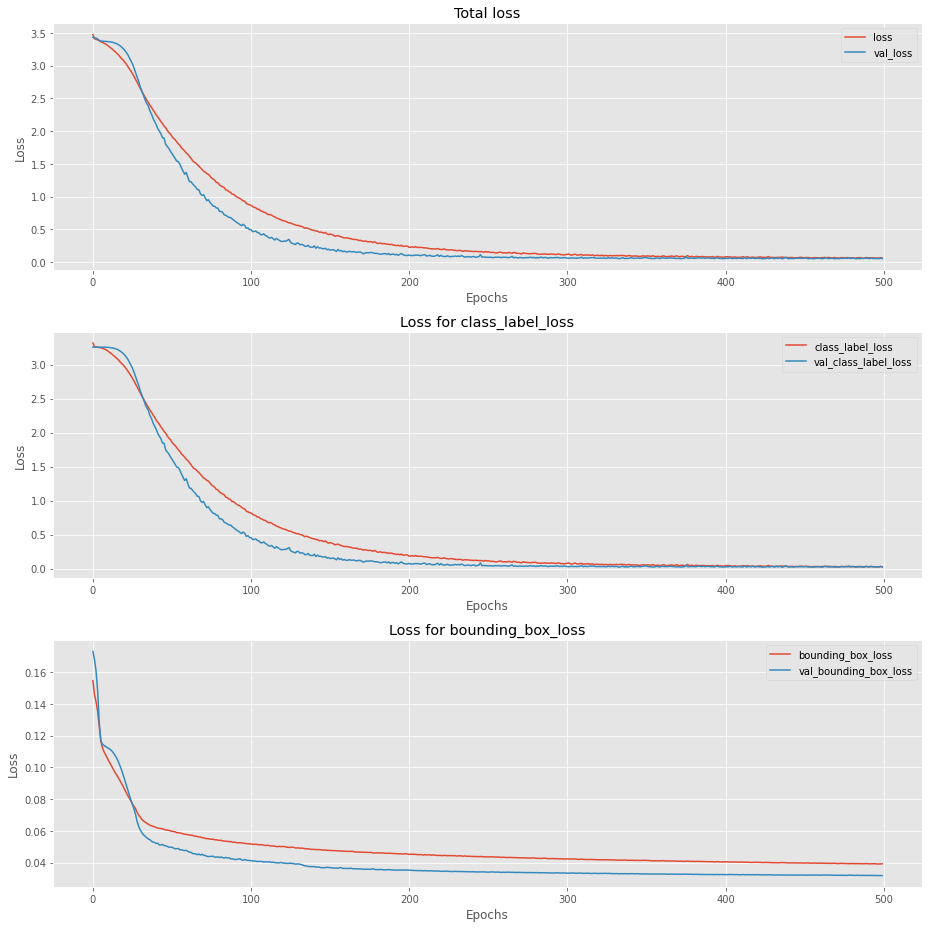

In [40]:
loss_names = ["loss", "class_label_loss", "bounding_box_loss"]
N = np.arange(0, 500)
plt.style.use("ggplot")
fig, ax = plt.subplots(3, 1, figsize=(13,13))

for i, loss in enumerate(loss_names):
    
    title = "Loss for {}".format(loss) if loss != "loss" else "Total loss"
    ax[i].set_title(title)
    ax[i].set_xlabel("Epochs")
    ax[i].set_ylabel("Loss")
    ax[i].plot(N, History.history[loss], label=loss)
    ax[i].plot(N, History.history["val_"+loss], label="val_"+loss)
    ax[i].legend()

plt.tight_layout()
plt.show()
plt.close()

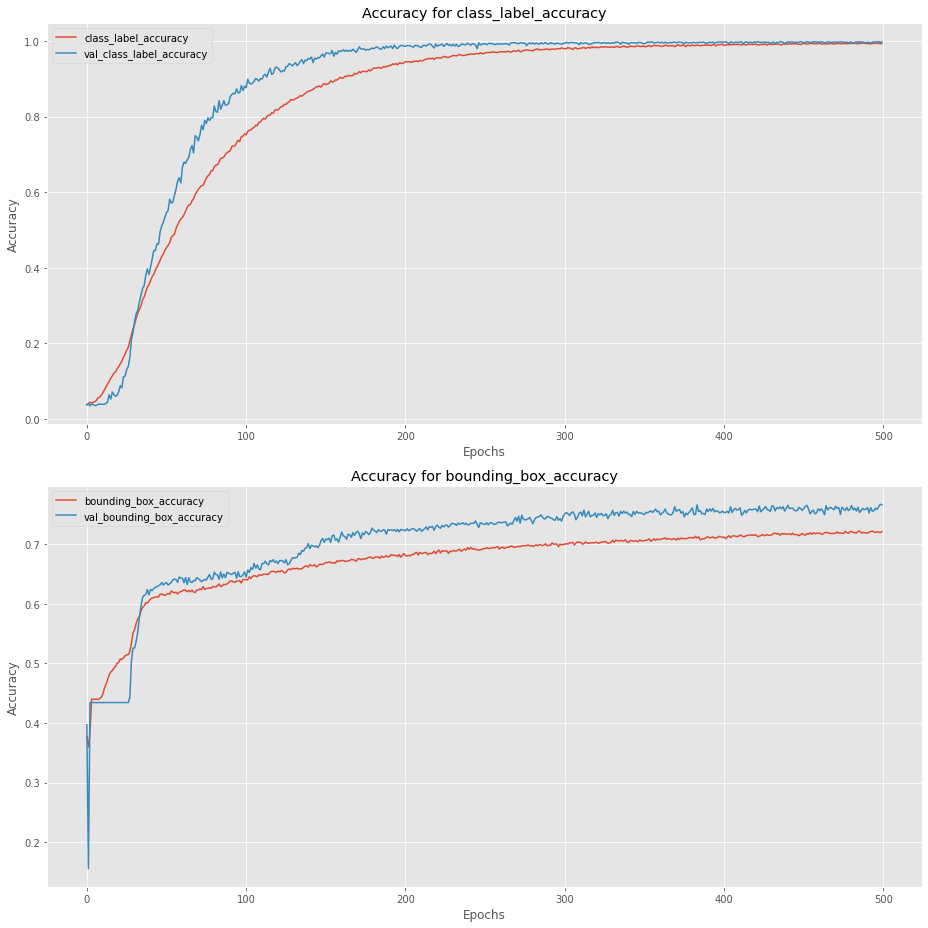

In [41]:
acc_names = ["class_label_accuracy", "bounding_box_accuracy"]

plt.style.use("ggplot")

fig, ax = plt.subplots(2, 1, figsize=(13,13))

for i, acc in enumerate(acc_names):
    
    title = "Accuracy for {}".format(acc) if acc != "accuracy" else "Total accuracy"
    ax[i].set_title(title)
    ax[i].set_xlabel("Epochs")
    ax[i].set_ylabel("Accuracy")
    ax[i].plot(N, History.history[acc], label=acc)
    ax[i].plot(N, History.history["val_"+acc], label="val_"+acc)
    ax[i].legend()

plt.tight_layout()
plt.show()
plt.close()

In [35]:
model.load_weights(MOD_PATH)

In [36]:
labs, bbs = model.predict(X_V)

### Metrics

In [37]:
def accuracy(predictions, validation):
    '''
    Number of correct predictions for multilable class classification.
    
    Had to utilize some code from 
    https://github.com/scikit-learn/scikit-learn/blob/0d378913be6d7e485b792ea36e9268be31ed52d0/sklearn/metrics/_classification.py#L135
    to get correct accuracy score. I was off by over 1% with my initial implementation of utilizing the
    tp + tn / tp + tn + fp + fn for each class and obtaining the average over each class approach.
    
    '''
    assert len(predictions) == len(validation), 'Not of same lengths'
    
    y_pred = csr_matrix(predictions)
    y_true = csr_matrix(validation)
    
    X = y_true - y_pred
    
    out = np.diff(X.indptr)
    out = out.astype("intp")
    
    score = out == 0
    
    return score.sum() / len(validation)

In [38]:
def precision(predictions, validation):
    '''
    true positives / true positives + false positives
    '''
    tp = 0
    fp = 0
    
    for pred, val in zip(predictions, validation):
        for p, v in zip(pred, val):
            if p == 1.0 and v == 1.0:
                tp += 1
            if p == 1.0 and v != 1.0:
                fp += 1
                
    return tp / (tp + fp)

In [39]:
def recall(predictions, validation):
    '''
    true positives / true positives + false negatives
    '''
    tp = 0
    fn = 0
    
    for pred, val in zip(predictions, validation):
        for p, v in zip(pred, val):
            if p == 1.0 and v == 1.0:
                tp += 1
            if p == 0.0 and v == 1.0:
                fn += 1
                
    return tp / (tp + fn)

In [40]:
def f1score(rec, pres):
    '''
    2 x (precision x recall / precision + recall)
    '''
    return 2 * (pres * rec) / (pres + rec)

In [41]:
acc = accuracy(labs.round(), Y_V)
pres = precision(labs.round(), Y_V)
rec = recall(labs.round(), Y_V)
f1 = f1score(rec, pres)
print("Accuracy: %.2f%%" % (acc * 100.0))
print("Precision: %.2f%%" % (pres * 100.0))
print("Recall: %.2f%%" % (rec * 100.0))
print("F1-score: %.2f" % (f1))

Accuracy: 99.65%
Precision: 99.69%
Recall: 99.65%
F1-score: 1.00


### Bounding Box Plotting and Accuracy Measurement

In [40]:
def box_plot(class_label, box_points, image):
    
    find_letter = [
        'A', 'B', 'C', 'D',
        'E', 'F', 'G', 'H',
        'I', 'J', 'K', 'L',
        'M', 'N', 'O', 'P',
        'Q', 'R', 'S', 'T',
        'U', 'V', 'W', 'X',
        'Y', 'Z'
    ]
    
    x, y, h, w = box_points
    
    x = int(x * 120)
    y = int(y * 120)
    h = int(h * 120)
    w = int(w * 120)
    
    image = cv.resize(image, (240, 240), interpolation=cv.INTER_CUBIC)
    
    text_loc = y - 15 if y - 15 > 15 else y + 15
    
    u, indices = np.unique(class_label.round(), return_index=True)
    
    if len(u) == 1:
        label = "Searching...."
        image = cv.putText(image, label, ((image.shape[0] - len(label)) // 2, 15), cv.FONT_HERSHEY_SIMPLEX,
                   0.45, (1.0, 1.0, 1.0), 2)
    if len(u) == 2:
        
        score = (class_label[indices[1]] * 100)
        
        letter = find_letter[indices[1]] + f": {score:.3f}%"
    
        image = cv.putText(image, letter, (x, text_loc), cv.FONT_HERSHEY_SIMPLEX,
                   0.45, (1.0, 1.0, 0.0), 1)
        
        image = cv.rectangle(image, (x, y), (x + h, y + w), (0.0, 0.0, 0.0), 2)
        
    return image

In [43]:
def intersection_over_union(pred_roi, true_roi, point_format="midpoint"):
    '''
    Calculate the accuracy of a predicted box against a true point
    
    intersected area of bounding boxes / total area of bounding boxes
    
    midpoint (x, y, w, h) or corners (x1, y1, x2, y2)
    '''
    pred_roi = pred_roi.dot(120).astype("int")
    
    if point_format == "midpoint":
        b_x1 = pred_roi[0] - pred_roi[2] / 2
        b_y1 = pred_roi[1] - pred_roi[3] / 2
        b_x2 = pred_roi[0] + pred_roi[2] / 2
        b_y2 = pred_roi[1] + pred_roi[3] / 2
        b2_x1 = true_roi[0] - true_roi[2] / 2
        b2_y1 = true_roi[1] - true_roi[3] / 2
        b2_x2 = true_roi[0] + true_roi[2] / 2
        b2_y2 = true_roi[1] + true_roi[3] / 2
    if point_format == "corners":
        b_x1 = pred_roi[0]
        b_y1 = pred_roi[1]
        b_x2 = pred_roi[2]
        b_y2 = pred_roi[3]
        b2_x1 = true_roi[0]
        b2_y1 = true_roi[1]
        b2_x2 = true_roi[2]
        b2_y2 = true_roi[3]
        
    x_1 = max(b_x1, b2_x1)
    y_1 = max(b_y1, b2_y1)
    x_2 = min(b_x2, b2_x2)
    y_2 = min(b_y2, b2_y2)
    
    intersection = np.clip((x_2 - x_1), 0, 240) * np.clip((y_2 - y_1), 0, 240)

    box_1_area = abs((b_x2 - b_x1) * (b_y2 - b_y1))
    box_2_area = abs((b2_x2 - b2_x1) * (b2_y2 - b2_y1))
    
    return (intersection / (box_1_area + box_2_area - intersection + 1e-6)) * 100
    

In [44]:
bounding_precisions = []
for box, roi, in zip(bbs, roi_y):
    box * 120
    bounding_precisions.append(intersection_over_union(box, roi))

In [45]:
bounds = np.asarray(bounding_precisions)

In [46]:
mean = bounds.mean()

In [47]:
print(f"Mean Average Precision Score: {mean:.2f}%")

Mean Average Precision Score: 53.56%


### Object Detection Video (work in progress)

In [41]:
cap = cv.VideoCapture(0)
cap.set(3, 1920)
cap.set(4, 1080)

window_name = "predicted image"

if not cap.isOpened():
    print("There was an issue opening your camera!")
    
cap.set(10, cv.CAP_PROP_FPS)
while True:
    
    ret, frame = cap.read()
    
    h, w = frame.shape[:2]
    
    frame = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    
    small_frame = cv.resize(frame, (120, 120), interpolation=cv.INTER_CUBIC)
    
    small_frame = np.array(small_frame) / 255.0
    
    small_frame = np.expand_dims(small_frame, axis=0)
    
    labs, bbs = model.predict(small_frame)
    
    larger_frame = box_plot(labs[0], bbs[0], small_frame[0])
    
    cv.imshow(window_name, larger_frame)
    
    cv.resizeWindow(window_name, 600, 600)
    
    if cv.waitKey(1) & 0xFF == ord('q'):
        break
        
cap.release()
cv.destroyAllWindows()

### Below will be a display of test set images with predicted box and ground truth. To be added before presentation

In [257]:
data = pd.read_csv('D:\\ASL_Final.csv', delimiter=',')
df_test = data.to_numpy()

In [258]:
df_test.shape

(26, 6)

In [259]:
df_test[0, :]

array(['A_test.jpg', 82, 28, 131, 116, 'A'], dtype=object)

In [260]:
Y_Temp = df_test[:, 1:]
Y_Temp.shape

(26, 5)

In [261]:
images = df_test[:, 0]
labels = df_test[:, -1]
PATH = 'D:\\Test_Imgs'

assert len(images)==len(labels), "There was a data loading issue"

In [262]:
im_paths = gather_images(images, labels, PATH)

In [263]:
print(im_paths[0], df_test[0])

D:\Test_Imgs\A\A_test.jpg ['A_test.jpg' 82 28 131 116 'A']


In [264]:
img_array = load_images(im_paths)

In [265]:
X_Test = np.array(img_array) / 255.0
img = X_Test[0]
X_Test = X_Test.reshape(X_Test.shape[0], 120, 120, 1)

In [266]:
Y_Temp[Y_Temp[:,-1]=='A', -1] = 0
Y_Temp[Y_Temp[:,-1]=='B', -1] = 1
Y_Temp[Y_Temp[:,-1]=='C', -1] = 2
Y_Temp[Y_Temp[:,-1]=='D', -1] = 3
Y_Temp[Y_Temp[:,-1]=='E', -1] = 4
Y_Temp[Y_Temp[:,-1]=='F', -1] = 5
Y_Temp[Y_Temp[:,-1]=='G', -1] = 6
Y_Temp[Y_Temp[:,-1]=='H', -1] = 7
Y_Temp[Y_Temp[:,-1]=='I', -1] = 8
Y_Temp[Y_Temp[:,-1]=='J', -1] = 9
Y_Temp[Y_Temp[:,-1]=='K', -1] = 10
Y_Temp[Y_Temp[:,-1]=='L', -1] = 11
Y_Temp[Y_Temp[:,-1]=='M', -1] = 12
Y_Temp[Y_Temp[:,-1]=='N', -1] = 13
Y_Temp[Y_Temp[:,-1]=='O', -1] = 14
Y_Temp[Y_Temp[:,-1]=='P', -1] = 15
Y_Temp[Y_Temp[:,-1]=='Q', -1] = 16
Y_Temp[Y_Temp[:,-1]=='R', -1] = 17
Y_Temp[Y_Temp[:,-1]=='S', -1] = 18
Y_Temp[Y_Temp[:,-1]=='T', -1] = 19
Y_Temp[Y_Temp[:,-1]=='U', -1] = 20
Y_Temp[Y_Temp[:,-1]=='V', -1] = 21
Y_Temp[Y_Temp[:,-1]=='W', -1] = 22
Y_Temp[Y_Temp[:,-1]=='X', -1] = 23
Y_Temp[Y_Temp[:,-1]=='Y', -1] = 24
Y_Temp[Y_Temp[:,-1]=='Z', -1] = 25

In [267]:
Y_Test = to_categorical(Y_Temp[:,-1])

In [268]:
ROI_Test = Y_Temp[:, :-1]

In [269]:
h, w = img.shape[:2]
ROI_Float = []

In [270]:
for box in ROI_Test:
    startx, starty, endx, endy = box
    startx = float(startx) / w
    starty = float(starty) / h
    endy = float(endy) / h
    endx = float(endx) / w
    ROI_Float.append([startx, starty, endy, endx])

In [271]:
ROI_Float = np.array(ROI_Float, dtype='float32')
ROI_GT = np.array(ROI_Test, dtype='float32')

In [272]:
model.load_weights(MOD_PATH)

In [273]:
Test_labs, Test_boxes = model.predict(X_Test)

In [274]:
test_results = []
i = 0
for label, box, image in zip(Test_labs, Test_boxes, X_Test):
    test_results.append(box_plot(label, box, image))
    i += 1

In [275]:
test_results = np.asarray(test_results)
test_results = test_results.reshape(len(test_results), 240, 240, 1)

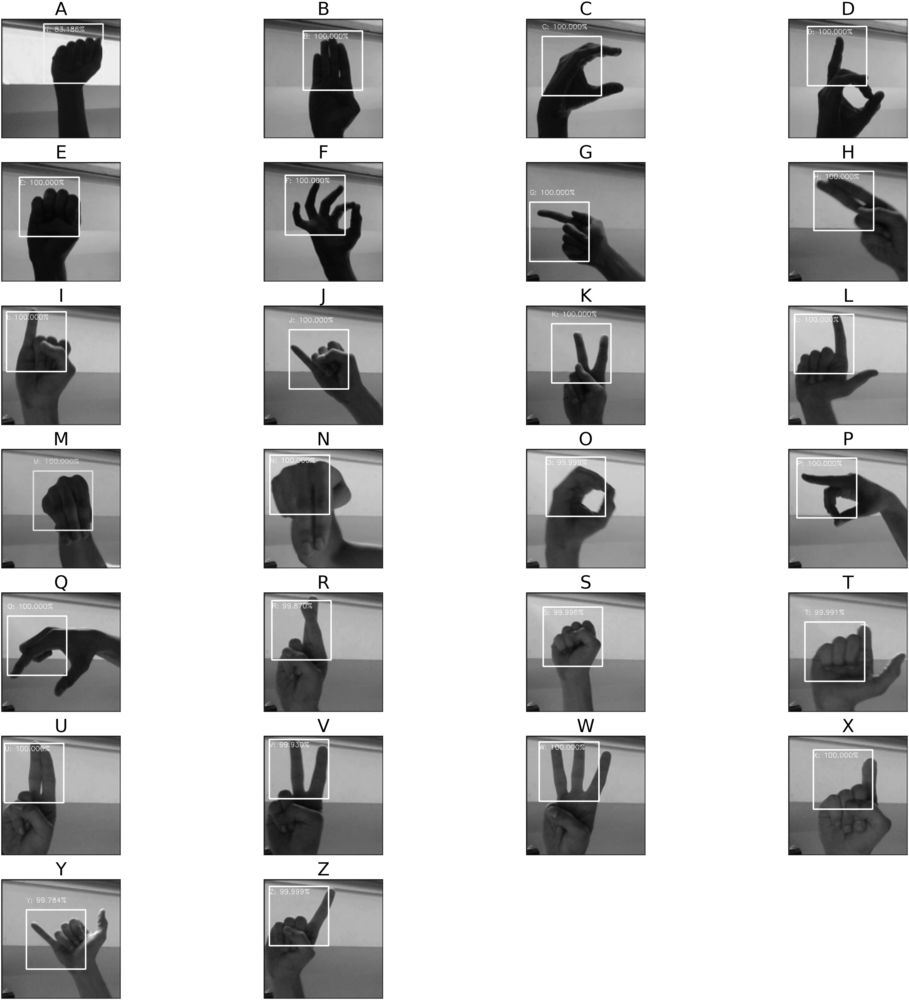

In [276]:
classes =  [
        'A', 'B', 'C', 'D',
        'E', 'F', 'G', 'H',
        'I', 'J', 'K', 'L',
        'M', 'N', 'O', 'P',
        'Q', 'R', 'S', 'T',
        'U', 'V', 'W', 'X',
        'Y', 'Z'
    ]

plt.figure(figsize=(100,100))
j = 1
for i in range(26):
    plt.subplot(7,4,j)
    plt.imshow(test_results[i], cmap="gray")
    plt.axis('off')
    u, ind = np.unique(Y_Test[i], return_index=True)
    plt.title(classes[ind[1]], fontdict=dict({'fontsize' : 100}))
    j+=1

In [282]:
ground_truth = []
for label, box, img in zip(Y_Test, ROI_Float, test_results):
    ground_truth.append(box_plot(label, box, img))

In [283]:
ground_truth = np.asarray(ground_truth)

In [284]:
ground_truth = ground_truth.reshape(len(ground_truth), 240, 240, 1)

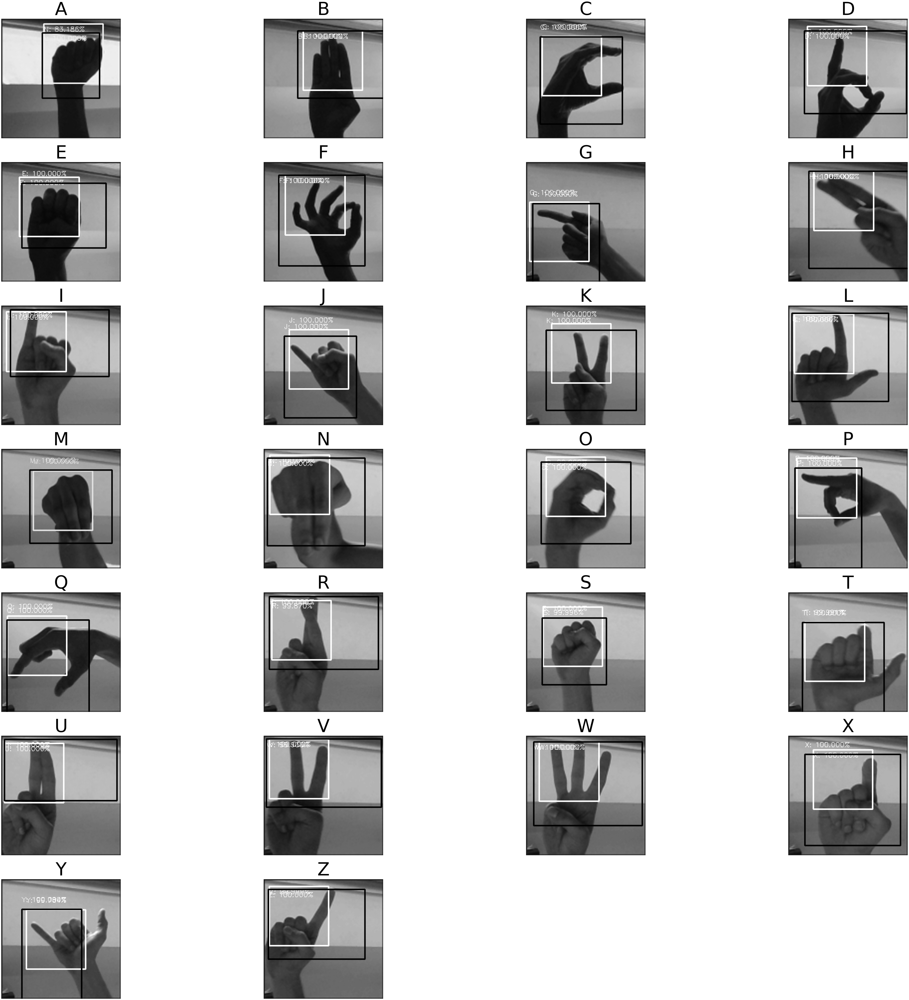

In [285]:
classes =  [
        'A', 'B', 'C', 'D',
        'E', 'F', 'G', 'H',
        'I', 'J', 'K', 'L',
        'M', 'N', 'O', 'P',
        'Q', 'R', 'S', 'T',
        'U', 'V', 'W', 'X',
        'Y', 'Z'
    ]

plt.figure(figsize=(100,100))
j = 1
for i in range(len(ground_truth)):
    plt.subplot(7,4,j)
    plt.imshow(ground_truth[i], cmap="gray")
    plt.axis('off')
    u, ind = np.unique(Y_Test[i], return_index=True)
    plt.title(classes[ind[1]], fontdict=dict({'fontsize' : 100}))
    j+=1

In [287]:
test_box_results = []
for box, roi, in zip(Test_boxes, ROI_Test):
    test_box_results.append(intersection_over_union(box, roi))

In [288]:
test_bounds = np.asarray(test_box_results)

In [289]:
test_mean = test_bounds.mean()

In [290]:
print(f"Mean Average Precision Score: {test_mean:.2f}%")

Mean Average Precision Score: 49.57%


In [291]:
acc = accuracy(Test_labs.round(), Y_Test)
pres = precision(Test_labs.round(), Y_Test)
rec = recall(Test_labs.round(), Y_Test)
f1 = f1score(rec, pres)
print("Accuracy: %.2f%%" % (acc * 100.0))
print("Precision: %.2f%%" % (pres * 100.0))
print("Recall: %.2f%%" % (rec * 100.0))
print("F1-score: %.2f" % (f1))

Accuracy: 96.15%
Precision: 96.15%
Recall: 96.15%
F1-score: 0.96
